In [33]:
import numpy as np
import pandas as pd
import array
import os
import matplotlib.pyplot as plt
from pydub import AudioSegment
# for wav
from scipy.io.wavfile import read, write
# for time - frequency analysis
from scipy.fft import fft, fftfreq, ifft, rfft, rfftfreq, irfft
from scipy.signal import stft, spectrogram

In [2]:
def time_domain_plot(signal, sample_rate):
    time = np.linspace(0., len(signal)/sample_rate, len(signal))
    plt.figure(figsize=(16,9))
    plt.plot(time, signal)
    plt.xlabel("Time [s]")
    plt.ylabel("Amplitude")
    plt.show()
def time_domain_plot_stereo(left_channel, right_channel, sample_rate):
    time = np.linspace(0., len(left_channel)/sample_rate, len(left_channel))
    plt.figure(figsize=(16,9))
    plt.plot(time, left_channel, label="Left Channel")
    plt.plot(time, right_channel, label="Right Channel")
    plt.legend()
    plt.xlabel("Time [s]")
    plt.ylabel("Amplitude")
    plt.show()

In [3]:
if True:   
    sound = AudioSegment.from_mp3("music/mp3/101-igor_levit-piano_sonata_no._1_in_f_minor_op._2_no.1_i._allegro-noir.mp3")
    
    # get raw audio data as a bytestring
    # the length is = len(sound)*channels*sample_rate*sample_size
    raw_data = sound.raw_data
    # get the frame rate
    sample_rate = sound.frame_rate
    # get amount of bytes contained in one sample
    sample_size = sound.sample_width
    # get channels
    channels = sound.channels
    print(f"Sample rate {sample_rate}")
    print(f"Amount of bytes in one sample {sample_size}")
    print(f"Channels: {channels}")
    print(f"Signal duration {len(sound)/1000}s")

Sample rate 44100
Amount of bytes in one sample 2
Channels: 2
Signal duration 221.893s


In [4]:
sound

## Splitting stereo to mono

In [5]:
mono_sound = sound.split_to_mono()

In [6]:
sound.channels

2

In [7]:
# left channel
mono_sound[0]

In [8]:
# right channel
mono_sound[1]

## Time-Frequency analysis

### Taking the first 5 seconds

In [9]:
TEST_SOUND_LENGTH = 5
test_sound = sound[:(TEST_SOUND_LENGTH*1000)]
test_sound_mono = test_sound.split_to_mono()

In [10]:
test_sound

In [11]:
# get raw_data as numbers instead of bytes
# the length is = len(sound)/1000*channels*sample_rate which is len(raw_data)/sample_size because we describe "sample_size" bytes with one number
# since we are splitting the stereo signal into two mono signals, each signal has one channel and the length is simply len(sound)/1000*sample_rate
left_samples = test_sound_mono[0].get_array_of_samples()
right_samples = test_sound_mono[1].get_array_of_samples()

### Plotting Signal in Time Domain

In [12]:
len(left_samples)/sample_rate

5.0

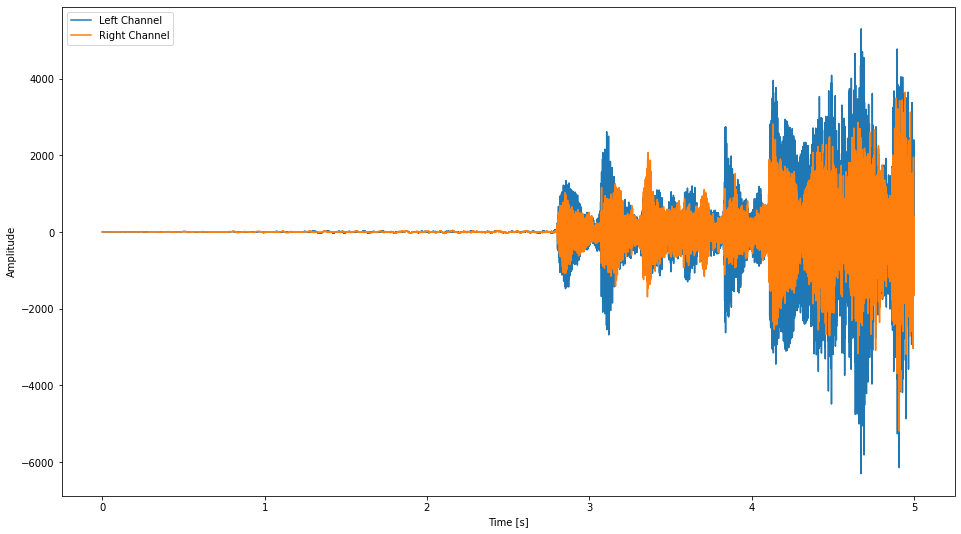

In [13]:
time_domain_plot_stereo(left_samples, right_samples, sample_rate)

### From time to frequency domain with Discrete Fourier Transform

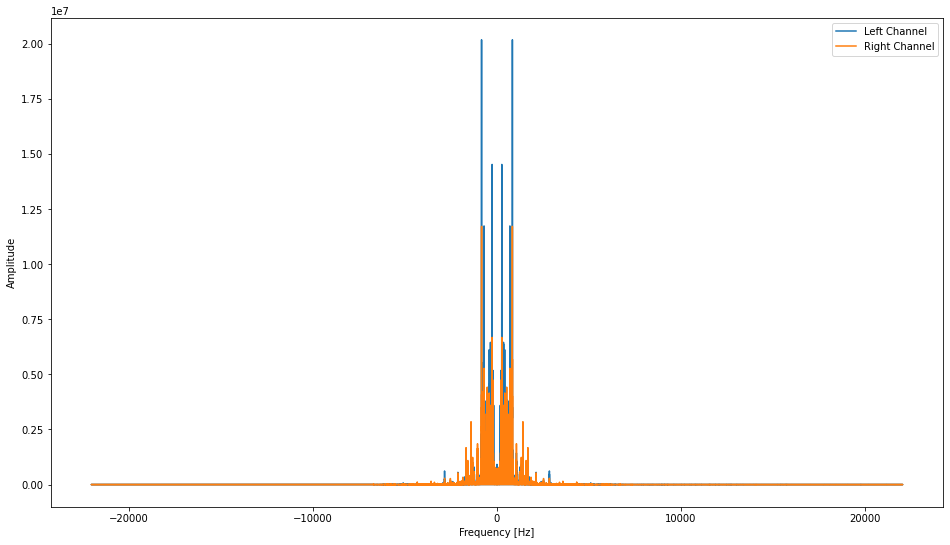

In [14]:
left_samples_ft = fft(left_samples)
right_samples_ft = fft(right_samples)
ft_frequencies = fftfreq(sample_rate*TEST_SOUND_LENGTH, 1 / sample_rate)
plt.figure(figsize=(16,9))
plt.plot(ft_frequencies, np.abs(left_samples_ft), label="Left Channel")
plt.plot(ft_frequencies, np.abs(right_samples_ft), label="Right Channel")
plt.xlabel("Frequency [Hz]")
plt.ylabel("Amplitude")
plt.legend()
plt.show()

### Getting back to time domain with inverse Fourier transform

/Users/lorenzo/Library/Caches/pypoetry/virtualenvs/music-ai-5sMQqm0D-py3.10/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


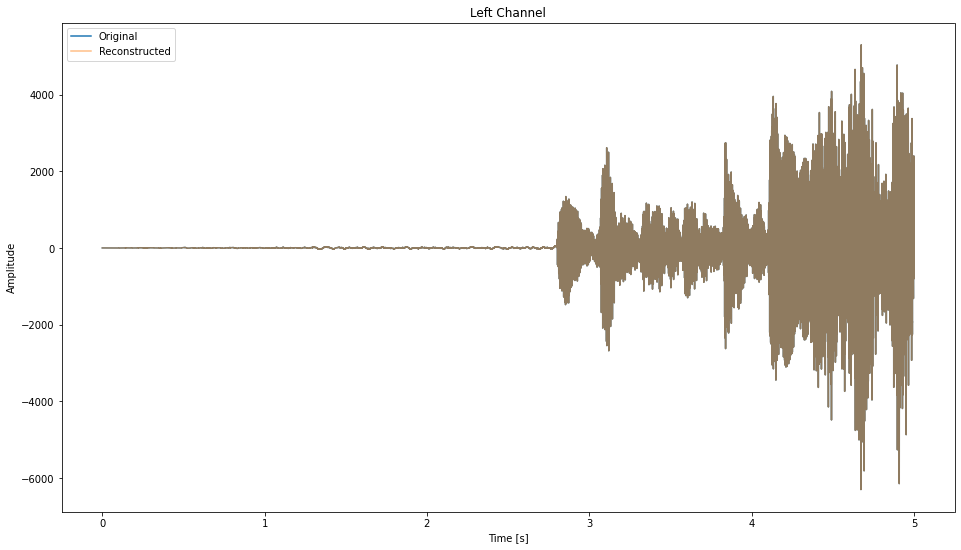

/Users/lorenzo/Library/Caches/pypoetry/virtualenvs/music-ai-5sMQqm0D-py3.10/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


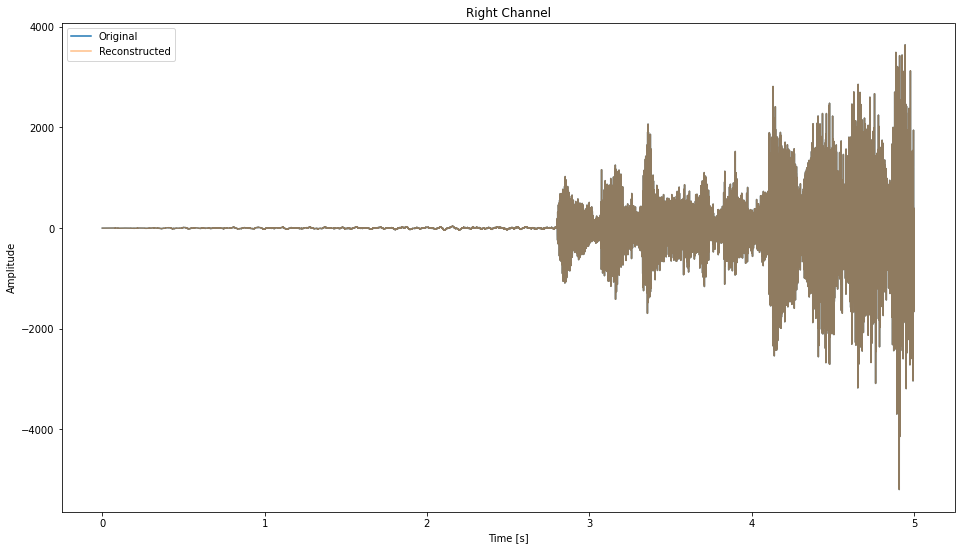

In [17]:
time = np.linspace(0., len(left_samples_ft)/sample_rate, len(left_samples_ft))
left_samples_reconstructed = ifft(left_samples_ft)
right_samples_reconstructed = ifft(right_samples_ft)
ft_frequencies = fftfreq(sample_rate*TEST_SOUND_LENGTH, 1 / sample_rate)
plt.figure(figsize=(16,9))
plt.plot(time, left_samples, label="Original")
plt.plot(time, left_samples_reconstructed, label="Reconstructed", alpha=0.5)
plt.title("Left Channel")
plt.legend()
plt.xlabel("Time [s]")
plt.ylabel("Amplitude")
plt.show()
plt.figure(figsize=(16,9))
plt.plot(time, right_samples, label="Original")
plt.plot(time, right_samples_reconstructed, label="Reconstructed", alpha=0.5)
plt.title("Right Channel")
plt.legend()
plt.xlabel("Time [s]")
plt.ylabel("Amplitude")
plt.show()

#### Restricting to real number with rfft

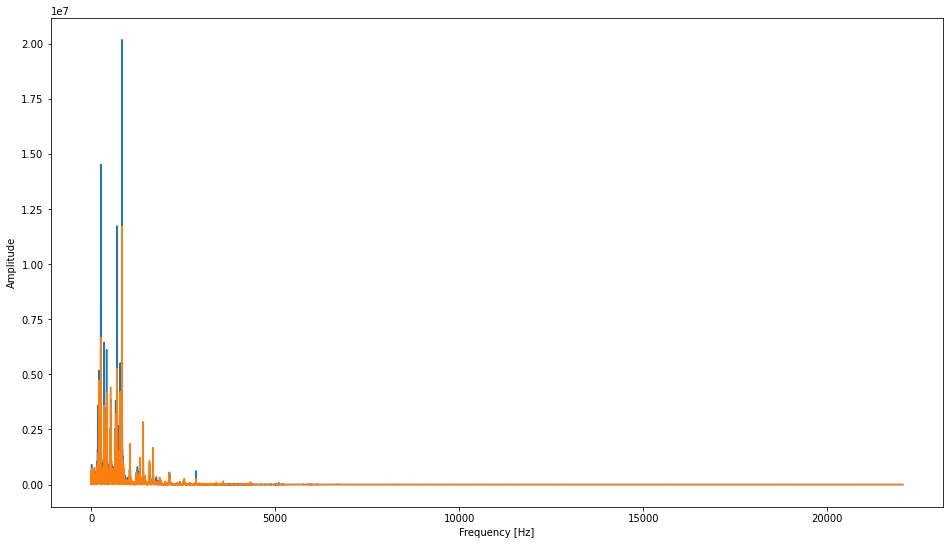

In [18]:
left_samples_rft = rfft(left_samples)
right_samples_rft = rfft(right_samples)
rft_frequencies = rfftfreq(sample_rate*TEST_SOUND_LENGTH, 1 / sample_rate)
plt.figure(figsize=(16,9))
plt.plot(rft_frequencies, np.abs(left_samples_rft), label="Left Channel")
plt.plot(rft_frequencies, np.abs(right_samples_rft), label="Right Channel")
plt.xlabel("Frequency [Hz]")
plt.ylabel("Amplitude")
plt.show()

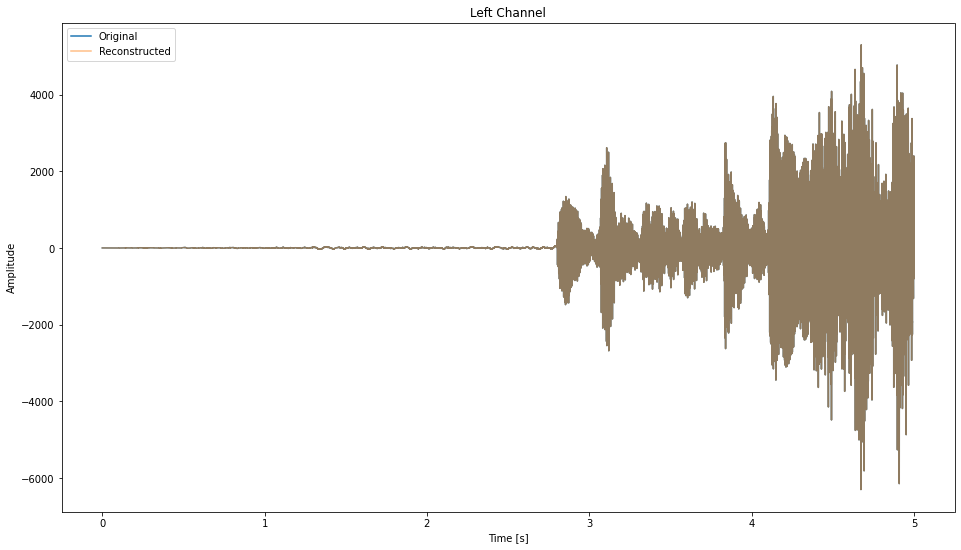

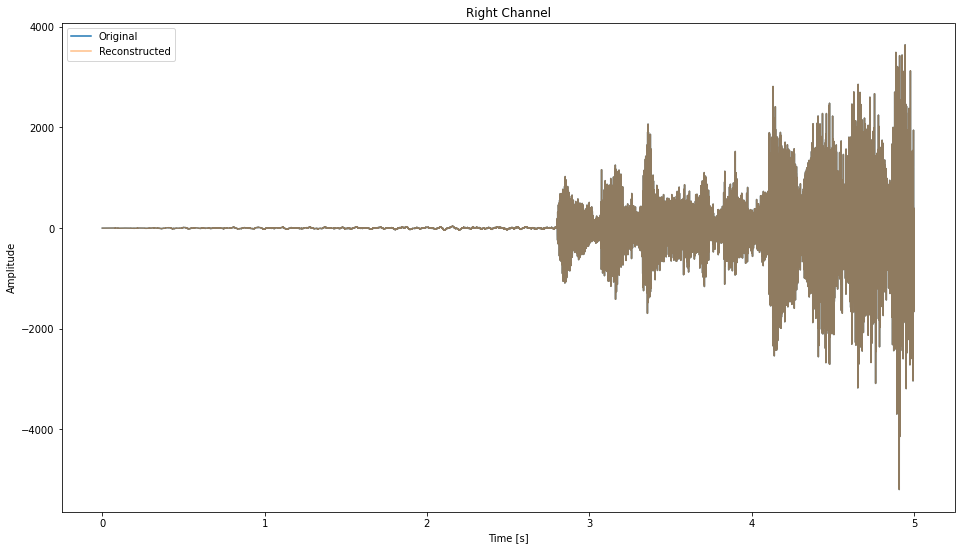

In [19]:
left_samples_reconstructed = irfft(left_samples_rft)
right_samples_reconstructed = irfft(right_samples_rft)
ft_frequencies = fftfreq(sample_rate*TEST_SOUND_LENGTH, 1 / sample_rate)
plt.figure(figsize=(16,9))
plt.plot(time, left_samples, label="Original")
plt.plot(time, left_samples_reconstructed, label="Reconstructed", alpha=0.5)
plt.title("Left Channel")
plt.legend()
plt.xlabel("Time [s]")
plt.ylabel("Amplitude")
plt.show()
plt.figure(figsize=(16,9))
plt.plot(time, right_samples, label="Original")
plt.plot(time, right_samples_reconstructed, label="Reconstructed", alpha=0.5)
plt.title("Right Channel")
plt.legend()
plt.xlabel("Time [s]")
plt.ylabel("Amplitude")
plt.show()

### Getting the sound back

Check for meaningful differences

In [20]:
for el in range(len(right_samples)):
    if np.abs(right_samples[el]-right_samples_reconstructed[el])>1e-10:
            print(right_samples[el])            
            print(samples_array[el])

In [21]:
# convert back to an integer array.array
left_samples_array = array.array('h', np.round(left_samples_reconstructed,0).astype(int))
right_samples_array = array.array('h', np.round(right_samples_reconstructed,0).astype(int))

In [22]:
for el in range(len(right_samples)):
    if np.abs(right_samples[el]-right_samples_array[el])>0:
            print(right_samples[el])            
            print(right_samples_array[el])

In [23]:
test_sound_mono[0]._spawn(left_samples_array)

In [24]:
test_sound_mono[0]._spawn(left_samples)

In [25]:
# reconstruct stereo signal
reconstructed_left_test_sound = test_sound_mono[0]._spawn(left_samples_array)
reconstructed_right_test_sound = test_sound_mono[0]._spawn(right_samples_array)
reconstructed_stereo_test_sound = AudioSegment.from_mono_audiosegments(reconstructed_left_test_sound, reconstructed_right_test_sound)

In [26]:
reconstructed_stereo_test_sound

### Going Further with the short-time Fourier Transform

In [27]:
mono_sound = sound.split_to_mono()

In [28]:
left_channel = mono_sound[0].get_array_of_samples()
right_channel = mono_sound[1].get_array_of_samples()

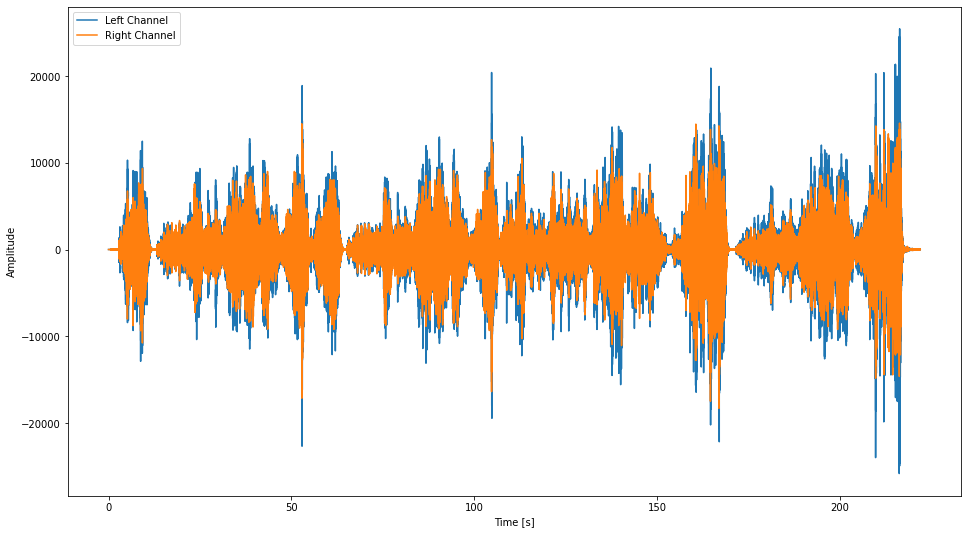

In [29]:
time_domain_plot_stereo(left_channel, right_channel, sample_rate)

In [30]:
TIMESTEP_LENGTH = 5000 # in milliseconds

In [48]:
sample_fr_left, tm_left, stft_left = stft(left_channel, sample_rate, nperseg=5)
sample_fr_right, tm_right, stft_right = stft(right_channel, sample_rate, nperseg=len(sound)/TIMESTEP_LENGTH)

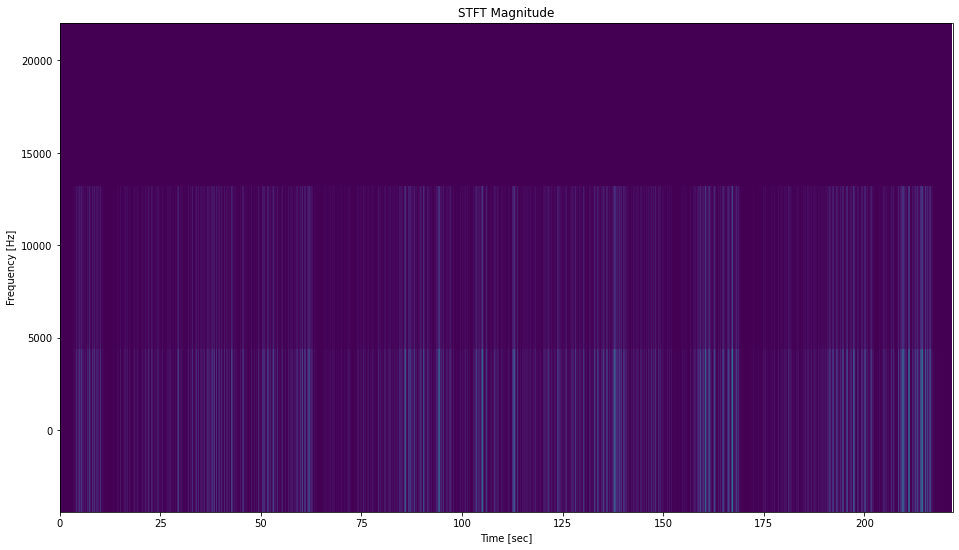

In [49]:
plt.figure(figsize=(16,9))
plt.pcolormesh(tm_left, sample_fr_left, np.abs(stft_left))
plt.title('STFT Magnitude')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()

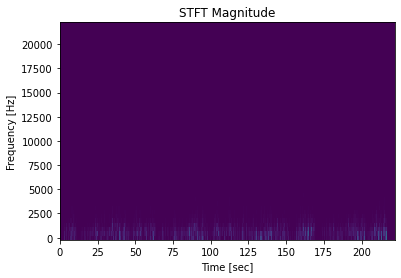

In [36]:
plt.figure(figsize=(16,9))
plt.pcolormesh(tm_right, sample_fr_right, np.abs(stft_right))
plt.title('STFT Magnitude')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()

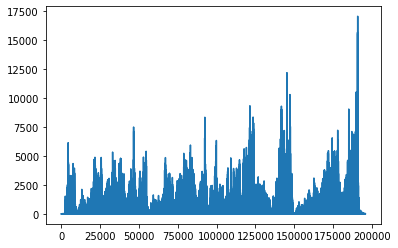

In [282]:
plt.plot(np.abs(stft_left[0]))